# CosmicLargeTrain Visual Comparison

This notebook compares `CosmicLargeTrain` and `CosmicLargeTrain_old` on the local `cosmic_large_local` subset with `num_refs=1`. It shows the target image, reference image, prompt, and the exact target/reference bboxes returned by the dataset item that goes into training.

In [1]:
from pathlib import Path
import copy
import random
import sys

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image, ImageDraw, ImageFont

REPO_ROOT = Path('/home/kolyangg/rsrch/diffusion_template')
DATASET_FULL_ROOT = Path('/home/kolyangg/rsrch/dataset_full')
DATA_JSON = DATASET_FULL_ROOT / 'cosmic_large/gathered_data_cosmic_large_filtered_sample_two.json'
FACE_IMAGES_ROOT = DATASET_FULL_ROOT / 'cosmic_large/LAION-5B-Filtered-Large-Faces'
TARGET_IMAGES_ROOT = DATASET_FULL_ROOT / 'LAION-5B-Filtered-Large'

NUM_REFS = 1
BASE_SEED = 1234

if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

print('repo:', REPO_ROOT)
print('json:', DATA_JSON)
print('face images:', FACE_IMAGES_ROOT)
print('target images:', TARGET_IMAGES_ROOT)

repo: /home/kolyangg/rsrch/diffusion_template
json: /home/kolyangg/rsrch/dataset_full/cosmic_large/gathered_data_cosmic_large_filtered_sample_two.json
face images: /home/kolyangg/rsrch/dataset_full/cosmic_large/LAION-5B-Filtered-Large-Faces
target images: /home/kolyangg/rsrch/dataset_full/LAION-5B-Filtered-Large


In [2]:
from hydra import compose, initialize_config_dir
from hydra.utils import instantiate
from omegaconf import OmegaConf

from src.datasets.cosmic import CosmicLargeTrain, CosmicLargeTrain_old
from src.datasets.collate import collate_fn

# Load the same transform stack used by the training config. Only pixel_values is
# transformed by BaseDataset; ref_images intentionally remain PIL images because
# PhotoMaker's id_image_processor consumes them later in model.forward().
with initialize_config_dir(version_base=None, config_dir=str(REPO_ROOT / 'src/configs')):
    cfg = compose(
        config_name='one_id_09Feb_testing',
        overrides=[
            'datasets=all_datasets',
            'train_dataset_name=cosmic_large_local',
            f'datasets.train.cosmic_large_local.num_refs={NUM_REFS}',
            'val_datasets_names=[]',
        ],
    )

instance_transforms = instantiate(cfg.transforms.instance_transforms.train)
new_ds_cfg = OmegaConf.to_container(cfg.datasets.train.cosmic_large_local, resolve=True)
new_ds_cfg.pop('_target_', None)
new_ds_cfg['num_refs'] = NUM_REFS
new_ds_cfg['instance_transforms'] = instance_transforms

# For old-class comparison, use exactly the same local file paths and transform
# config, only swapping the Python class. The old class will apply its legacy
# target/ref/bbox logic to the same subset.
old_ds_cfg = copy.deepcopy(new_ds_cfg)

new_ds = CosmicLargeTrain(**new_ds_cfg)
old_ds = CosmicLargeTrain_old(**old_ds_cfg)

print('CosmicLargeTrain length:', len(new_ds))
print('CosmicLargeTrain_old length:', len(old_ds))
print('num_refs:', NUM_REFS)
print('transforms:', instance_transforms)

100%|██████████| 15/15 [00:00<00:00, 213995.10it/s]

CosmicLargeTrain length: 15
CosmicLargeTrain_old length: 15
num_refs: 1
transforms: {'pixel_values': Compose(
      Resize(size=[1024, 1024], interpolation=bilinear, max_size=None, antialias=True)
      ToTensor()
      Normalize(mean=[0.5], std=[0.5])
)}


In [3]:
def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)


def get_item(ds, idx, seed=BASE_SEED):
    seed_everything(seed + idx)
    return ds[idx]


def target_path_for_dataset_item(ds, idx):
    if isinstance(ds, CosmicLargeTrain_old):
        return str(ds.ids[idx])
    return str(ds._index[idx].get('image_path'))


def build_path_to_idx(ds):
    return {target_path_for_dataset_item(ds, idx): idx for idx in range(len(ds))}


old_idx_by_path = build_path_to_idx(old_ds)
shared_new_indices = [i for i in range(len(new_ds)) if target_path_for_dataset_item(new_ds, i) in old_idx_by_path]
shared_paths = [target_path_for_dataset_item(new_ds, i) for i in shared_new_indices]
print('shared target paths:', len(shared_paths))
print('first shared path:', shared_paths[0] if shared_paths else None)

shared target paths: 15
first shared path: LAION-5B-Filtered-Large/laion1B-nolang/00000/1106668009939.jpg


In [4]:
def tensor_or_pil_to_image(x):
    if isinstance(x, Image.Image):
        return x.convert('RGB')
    if torch.is_tensor(x):
        t = x.detach().cpu()
        if t.ndim == 4:
            t = t[0]
        if t.ndim == 3 and t.shape[0] in (1, 3):
            # Training transform normalizes pixel_values with mean=0.5, std=0.5.
            t = (t.float() * 0.5 + 0.5).clamp(0, 1)
            if t.shape[0] == 1:
                t = t.repeat(3, 1, 1)
            arr = (t.permute(1, 2, 0).numpy() * 255).round().astype(np.uint8)
            return Image.fromarray(arr)
    raise TypeError(f'Unsupported image type: {type(x)}')


def as_bbox_list(value):
    if value is None:
        return []
    if torch.is_tensor(value):
        value = value.detach().cpu().tolist()
    if isinstance(value, np.ndarray):
        value = value.tolist()
    if isinstance(value, (list, tuple)) and len(value) == 4 and all(isinstance(v, (int, float, np.number)) for v in value):
        return [list(map(float, value))]
    return [list(map(float, bbox)) for bbox in value]


def draw_bboxes(image, bboxes, labels=None, colors=None, width=5):
    img = tensor_or_pil_to_image(image).copy()
    draw = ImageDraw.Draw(img)
    bboxes = as_bbox_list(bboxes)
    labels = labels or [None] * len(bboxes)
    colors = colors or ['red', 'lime', 'cyan', 'yellow']
    for i, bbox in enumerate(bboxes):
        x0, y0, x1, y1 = bbox
        color = colors[i % len(colors)]
        draw.rectangle([x0, y0, x1, y1], outline=color, width=width)
        if labels[i]:
            draw.rectangle([x0, max(0, y0 - 22), x0 + 10 + 8 * len(labels[i]), y0], fill=color)
            draw.text((x0 + 4, max(0, y0 - 20)), labels[i], fill='black')
    return img


def ref_bboxes_for_item(item):
    if 'face_bboxes_ref' in item:
        return as_bbox_list(item['face_bboxes_ref'])
    return as_bbox_list(item.get('face_bbox_ref'))


def print_item_summary(name, idx, item, path=None):
    refs = item['ref_images'] if isinstance(item['ref_images'], (list, tuple)) else [item['ref_images']]
    print(f'[{name}] idx={idx}')
    if path is not None:
        print('target path:', path)
    print('prompt:', item.get('prompt') or item.get('prompts'))
    print('pixel_values:', tuple(item['pixel_values'].shape) if torch.is_tensor(item['pixel_values']) else type(item['pixel_values']))
    print('face_bbox:', item.get('face_bbox'))
    print('num ref images:', len(refs))
    print('ref image sizes:', [r.size if isinstance(r, Image.Image) else tuple(r.shape) for r in refs])
    print('face_bbox_ref:', item.get('face_bbox_ref'))
    print('face_bboxes_ref:', item.get('face_bboxes_ref'))
    print('keys:', sorted(item.keys()))

In [5]:
def show_dataset_item(name, item, idx=None, path=None):
    refs = item['ref_images'] if isinstance(item['ref_images'], (list, tuple)) else [item['ref_images']]
    ref_bboxes = ref_bboxes_for_item(item)
    ncols = 1 + len(refs)
    fig, axes = plt.subplots(1, ncols, figsize=(5 * ncols, 5), squeeze=False)
    axes = axes[0]

    target_vis = draw_bboxes(item['pixel_values'], item['face_bbox'], labels=['target face'], colors=['red'])
    axes[0].imshow(target_vis)
    axes[0].axis('off')
    axes[0].set_title(f'{name}: target' + (f' idx={idx}' if idx is not None else ''))

    for j, ref in enumerate(refs):
        bbox = ref_bboxes[j] if j < len(ref_bboxes) else None
        ref_vis = draw_bboxes(ref, bbox, labels=[f'ref {j} face'], colors=['lime']) if bbox is not None else tensor_or_pil_to_image(ref)
        axes[j + 1].imshow(ref_vis)
        axes[j + 1].axis('off')
        axes[j + 1].set_title(f'{name}: ref {j}')

    title = item.get('prompt') or item.get('prompts') or ''
    if path is not None:
        title = f'{path}\n{title}'
    fig.suptitle(title, fontsize=10)
    plt.tight_layout()
    plt.show()


def compare_same_path(new_idx=0, seed=BASE_SEED):
    path = target_path_for_dataset_item(new_ds, new_idx)
    if path not in old_idx_by_path:
        raise KeyError(f'Path not present in old dataset: {path}')
    old_idx = old_idx_by_path[path]

    new_item = get_item(new_ds, new_idx, seed=seed)
    old_item = get_item(old_ds, old_idx, seed=seed)

    print_item_summary('CosmicLargeTrain', new_idx, new_item, path=path)
    print()
    print_item_summary('CosmicLargeTrain_old', old_idx, old_item, path=path)

    show_dataset_item('CosmicLargeTrain', new_item, idx=new_idx, path=path)
    show_dataset_item('CosmicLargeTrain_old', old_item, idx=old_idx, path=path)
    return new_item, old_item

## Random 8-Sample Visual Comparison

This cell shows 8 reproducible random shared target paths. Each path is displayed once through `CosmicLargeTrain` and once through `CosmicLargeTrain_old`.

random new indices: [12, 7, 1, 0, 14, 9, 11, 10]
[CosmicLargeTrain] idx=12
target path: LAION-5B-Filtered-Large/laion1B-nolang/00120/1061231002161.jpg
prompt: The girl img has long brown hair in a braid, youthful face, cheerful smile showing teeth, light skin, expressive dark eyes, happy and engaged appearance, sits at a table, wears a light blue cardigan over a purple shirt, arms rest on the table, hands near a toy castle, body slightly left, facing the camera, relaxed and attentive posture, white couch with sparkling pillows, miniature ice castle toy set on the table, string lights behind, cozy and playful festive atmosphere
pixel_values: (3, 1024, 1024)
face_bbox: [632, 335, 802, 551]
num ref images: 1
ref image sizes: [(256, 256)]
face_bbox_ref: [28.0, 34.0, 199.0, 240.0]
face_bboxes_ref: [[28.0, 34.0, 199.0, 240.0]]
keys: ['background_caption', 'bbox', 'crop_top_lefts', 'face_bbox', 'face_bbox_ref', 'face_bboxes_ref', 'face_mask', 'facial_caption', 'original_sizes', 'pixel_values'

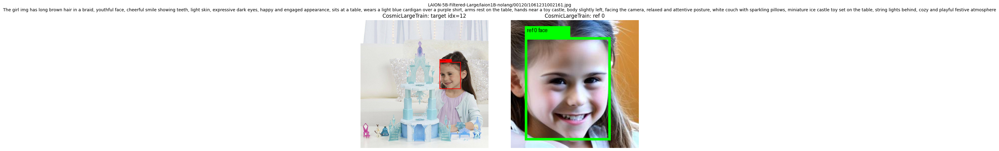

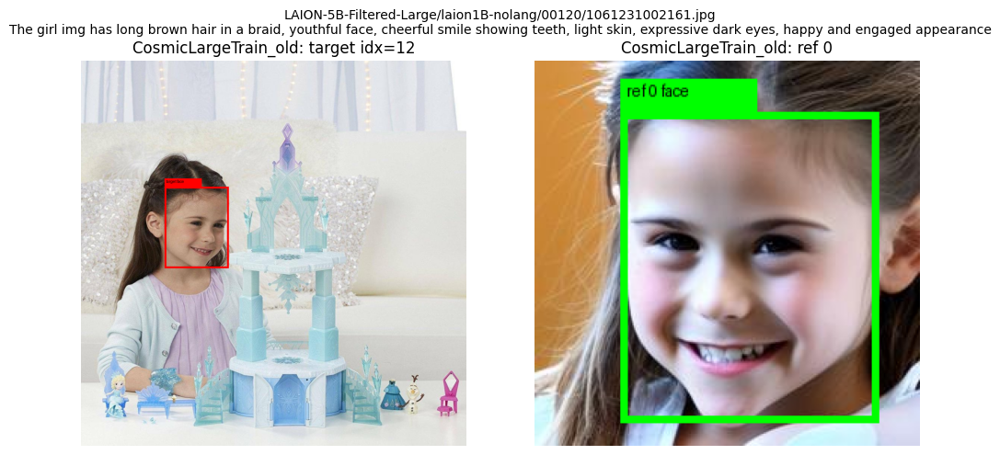

[CosmicLargeTrain] idx=7
target path: LAION-5B-Filtered-Large/laion1B-nolang/00000/1040113007278.jpg
prompt: The woman img has long, dark brown hair, warm smile, subtle makeup, wears a green jacket over a striped shirt, bright pink skirt, navy blue rain boots, and a light pink scarf; holds a polka-dotted umbrella with right hand, left arm by side; body faces forward, head turns slightly to the side, gaze upward and to the side, lush green lawn bordered by a white fence and road, large bush with golden-brown leaves to the right, trees with purple blossoms and green foliage in background, overcast sky
pixel_values: (3, 1024, 1024)
face_bbox: [476, 62, 546, 167]
num ref images: 1
ref image sizes: [(256, 256)]
face_bbox_ref: [52.0, 35.0, 191.0, 248.0]
face_bboxes_ref: [[52.0, 35.0, 191.0, 248.0]]
keys: ['background_caption', 'bbox', 'crop_top_lefts', 'face_bbox', 'face_bbox_ref', 'face_bboxes_ref', 'face_mask', 'facial_caption', 'original_sizes', 'pixel_values', 'pose_caption', 'prompt', '

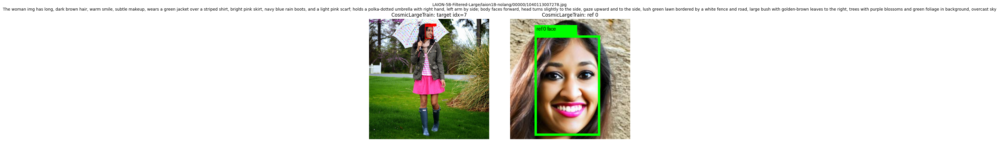

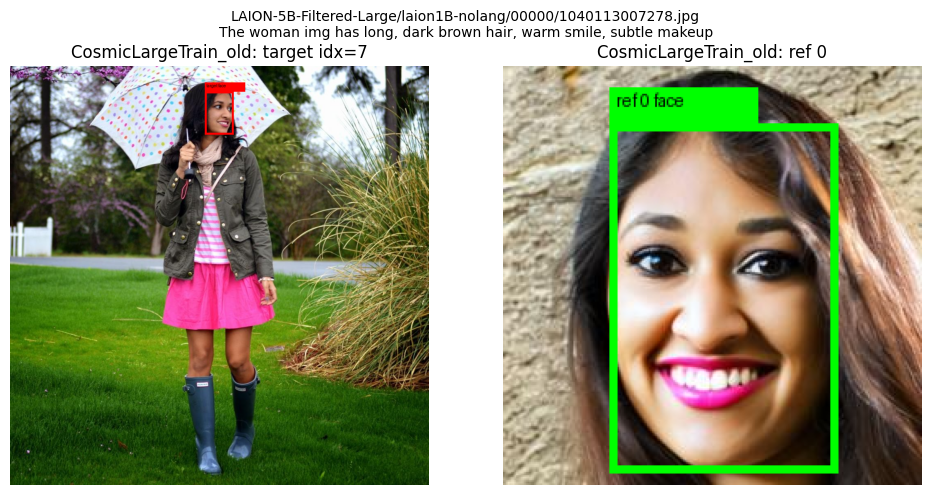

[CosmicLargeTrain] idx=1
target path: LAION-5B-Filtered-Large/laion1B-nolang/00000/1129173005789.webp
prompt: The woman img has long dark brown braids, serene, eyes closed (comfort/relief), young, smooth skin, calm expression, embraced, wears textured gray cloak over dark dress, arms around man's neck, hands clasped, man's arm around waist, facing away from camera, snowy landscape, white ground with footprints, blurred figure nearby, quiet somber atmosphere
pixel_values: (3, 1024, 1024)
face_bbox: [385, 233, 527, 403]
num ref images: 1
ref image sizes: [(239, 239)]
face_bbox_ref: [50.0, 34.0, 189.0, 205.0]
face_bboxes_ref: [[50.0, 34.0, 189.0, 205.0]]
keys: ['background_caption', 'bbox', 'crop_top_lefts', 'face_bbox', 'face_bbox_ref', 'face_bboxes_ref', 'face_mask', 'facial_caption', 'original_sizes', 'pixel_values', 'pose_caption', 'prompt', 'prompts', 'ref_images', 'target_sizes']

[CosmicLargeTrain_old] idx=1
target path: LAION-5B-Filtered-Large/laion1B-nolang/00000/1129173005789.we

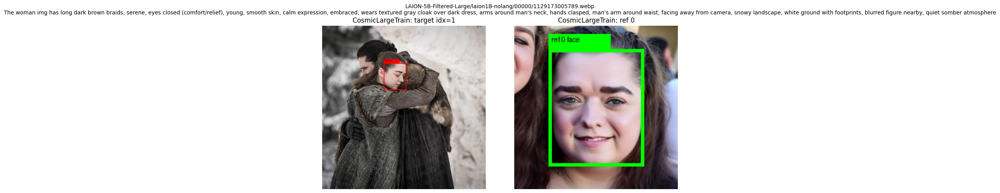

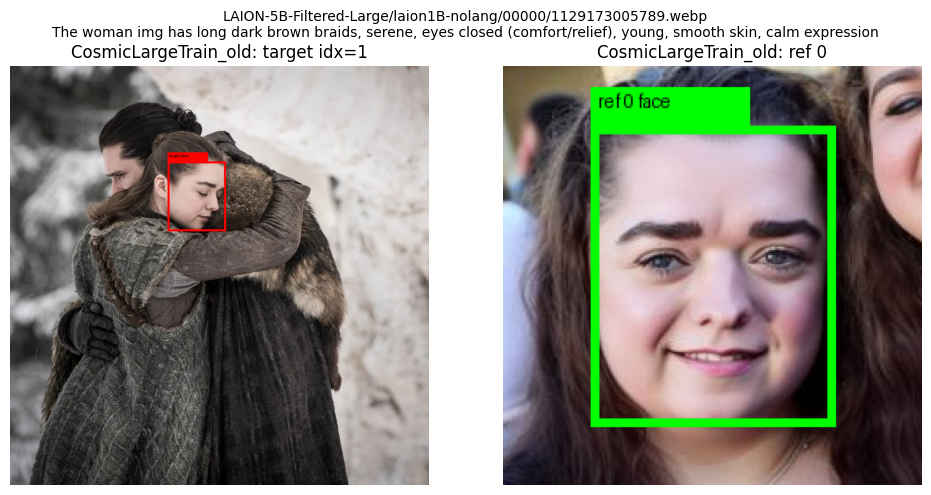

[CosmicLargeTrain] idx=0
target path: LAION-5B-Filtered-Large/laion1B-nolang/00000/1106668009939.jpg
prompt: The woman img has light brown styled hair with soft waves, makeup accentuates blue eyes and pink lips, wears delicate earrings and a headpiece, serene expression with slight smile, youthful and radiant, stands with back slightly turned, sleeveless intricately beaded gown with sheer back adorned with cascading pearls, left hand rests on hip, right arm bent, mermaid-style skirt, gazes over shoulder, dark textured backdrop, black curtain drapes left, emphasizes attire
pixel_values: (3, 1024, 1024)
face_bbox: [744, 73, 829, 188]
num ref images: 1
ref image sizes: [(256, 249)]
face_bbox_ref: [68.0, 41.0, 204.0, 244.0]
face_bboxes_ref: [[68.0, 41.0, 204.0, 244.0]]
keys: ['background_caption', 'bbox', 'crop_top_lefts', 'face_bbox', 'face_bbox_ref', 'face_bboxes_ref', 'face_mask', 'facial_caption', 'original_sizes', 'pixel_values', 'pose_caption', 'prompt', 'prompts', 'ref_images', 'tar

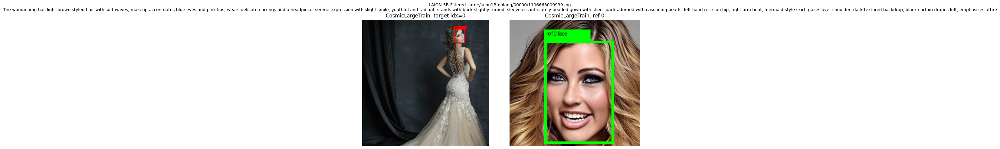

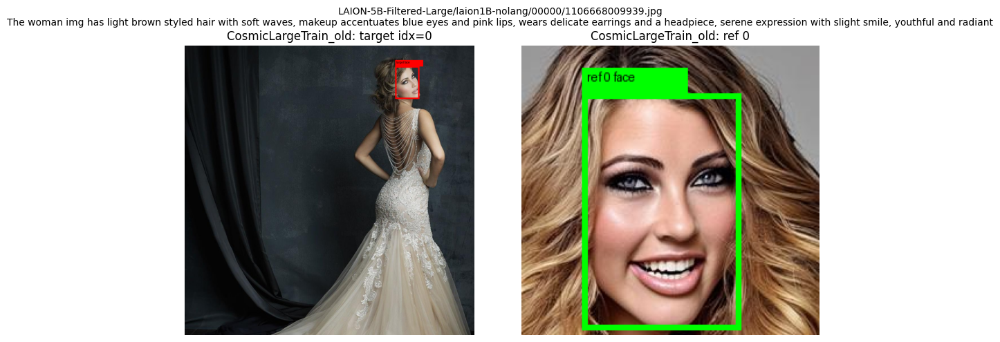

[CosmicLargeTrain] idx=14
target path: LAION-5B-Filtered-Large/laion1B-nolang/00120/1035422008593.webp
prompt: The woman img has warm smile, eyes crinkled, dark hair peeking out, middle-aged, friendly approachable expression, looks directly at camera, holds umbrella with right hand, left hand brings leaf to mouth, wears colorful dress with geometric patterns (orange, black, white, pink), light beige headscarf and blue scarf around neck, body angled toward camera, lush green garden with dense foliage, stone wall with vines, metal ladder, grassy ground, raindrops on umbrella and leaves
pixel_values: (3, 1024, 1024)
face_bbox: [504, 311, 704, 567]
num ref images: 1
ref image sizes: [(248, 233)]
face_bbox_ref: [53.0, 36.0, 195.0, 213.0]
face_bboxes_ref: [[53.0, 36.0, 195.0, 213.0]]
keys: ['background_caption', 'bbox', 'crop_top_lefts', 'face_bbox', 'face_bbox_ref', 'face_bboxes_ref', 'face_mask', 'facial_caption', 'original_sizes', 'pixel_values', 'pose_caption', 'prompt', 'prompts', 'ref_

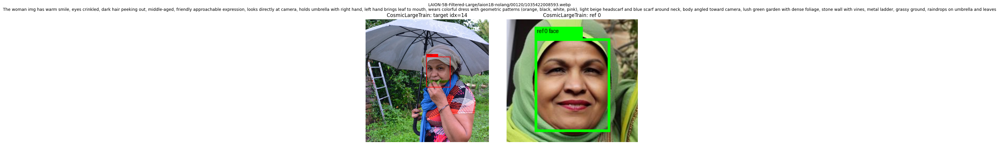

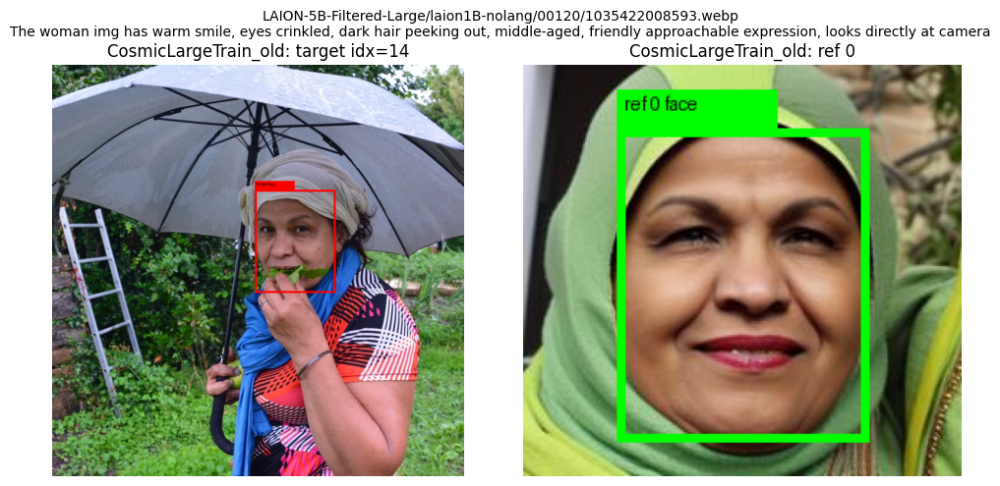

[CosmicLargeTrain] idx=9
target path: LAION-5B-Filtered-Large/laion1B-nolang/00120/1186637015773.webp
prompt: The woman img has straight, shoulder-length black hair parted down the middle, neutral expression, calm and composed, youthful with smooth skin and minimal makeup, stands confidently facing forward, wears a black coat with a plush collar over a dark purple dress, arms hang by sides, one holding a small clutch, upright posture exuding elegance and poise, fashion show runway with bright lights, blurred spectators on both sides, dark background contrasting the catwalk, high-end atmosphere
pixel_values: (3, 1024, 1024)
face_bbox: [477, 47, 594, 208]
num ref images: 1
ref image sizes: [(251, 245)]
face_bbox_ref: [56.0, 36.0, 193.0, 217.0]
face_bboxes_ref: [[56.0, 36.0, 193.0, 217.0]]
keys: ['background_caption', 'bbox', 'crop_top_lefts', 'face_bbox', 'face_bbox_ref', 'face_bboxes_ref', 'face_mask', 'facial_caption', 'original_sizes', 'pixel_values', 'pose_caption', 'prompt', 'prompt

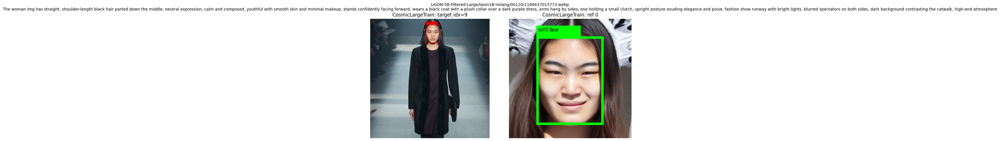

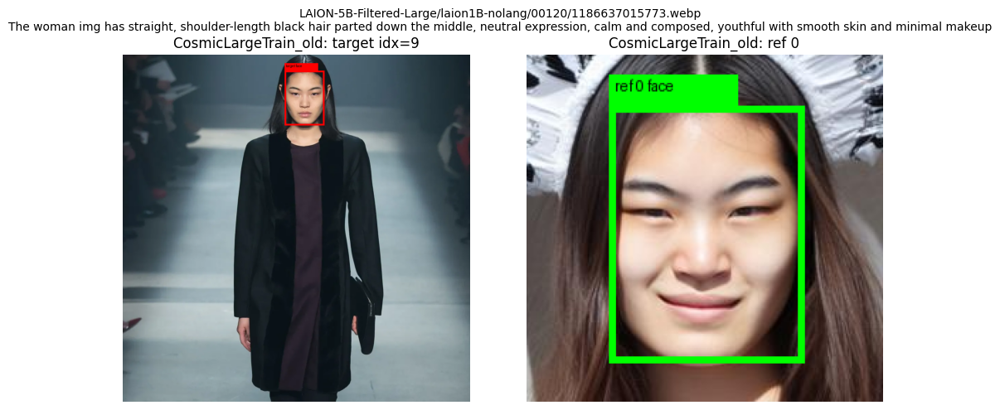

[CosmicLargeTrain] idx=11
target path: LAION-5B-Filtered-Large/laion1B-nolang/00120/816358005752.jpg
prompt:  person img with the model has a confident, neutral expression with smoky eye makeup, sleek updo, smooth skin tone, youthful, exuding elegance and poise, walks confidently down the runway, body facing forward, wears a black-and-white dress with a high slit, one shoulder draped in white fabric, arms hang naturally, gazes straight ahead, full body visible, intricate geometric pattern in pastel tones, photographers and spectators on either side, fashion show environment
pixel_values: (3, 1024, 1024)
face_bbox: [445, 67, 548, 204]
num ref images: 1
ref image sizes: [(246, 256)]
face_bbox_ref: [59.0, 37.0, 208.0, 228.0]
face_bboxes_ref: [[59.0, 37.0, 208.0, 228.0]]
keys: ['background_caption', 'bbox', 'crop_top_lefts', 'face_bbox', 'face_bbox_ref', 'face_bboxes_ref', 'face_mask', 'facial_caption', 'original_sizes', 'pixel_values', 'pose_caption', 'prompt', 'prompts', 'ref_images', 't

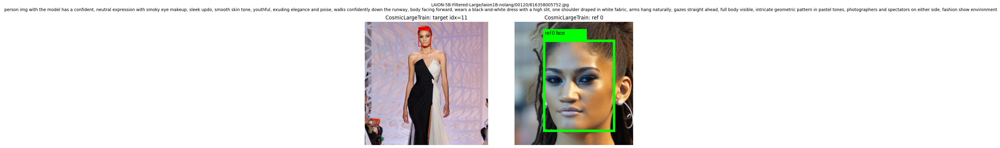

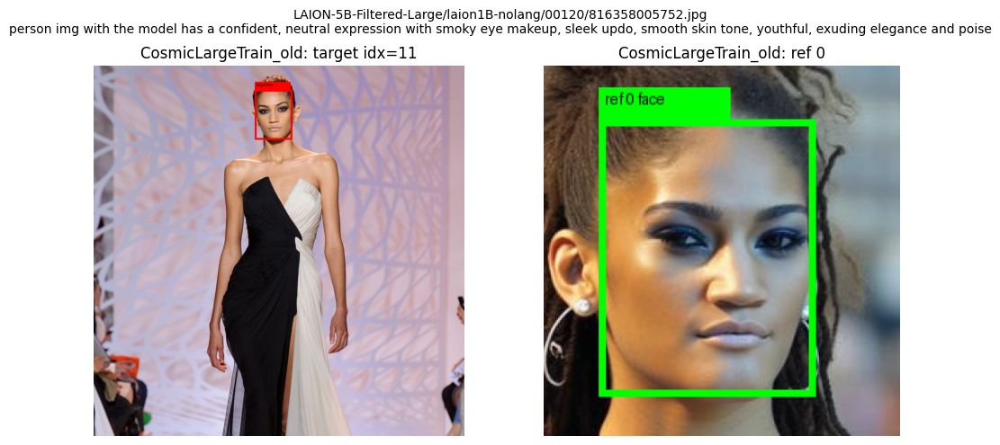

[CosmicLargeTrain] idx=10
target path: LAION-5B-Filtered-Large/laion1B-nolang/00120/1087567013854.jpg
prompt: The man img has short, light-colored hair with a receding hairline, clean-shaven with a neatly trimmed beard, neutral expression, brown eyes looking directly at the camera, smooth skin, wears a gray sweater over a red collared shirt, upper body visible, facing the camera directly, gaze straight ahead, bold text "ETING TAL VENTES" in white and yellow letters on vibrant pink backdrop, yellow border on top and bottom edges
pixel_values: (3, 1024, 1024)
face_bbox: [542, 64, 920, 601]
num ref images: 1
ref image sizes: [(256, 256)]
face_bbox_ref: [67.0, 11.0, 212.0, 244.0]
face_bboxes_ref: [[67.0, 11.0, 212.0, 244.0]]
keys: ['background_caption', 'bbox', 'crop_top_lefts', 'face_bbox', 'face_bbox_ref', 'face_bboxes_ref', 'face_mask', 'facial_caption', 'original_sizes', 'pixel_values', 'pose_caption', 'prompt', 'prompts', 'ref_images', 'target_sizes']

[CosmicLargeTrain_old] idx=10
ta

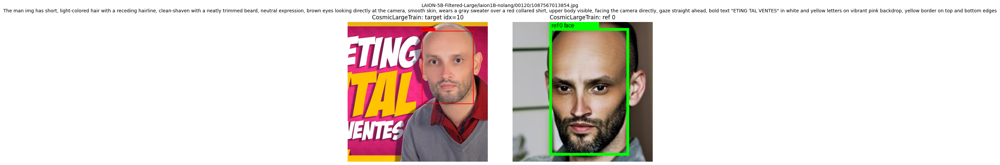

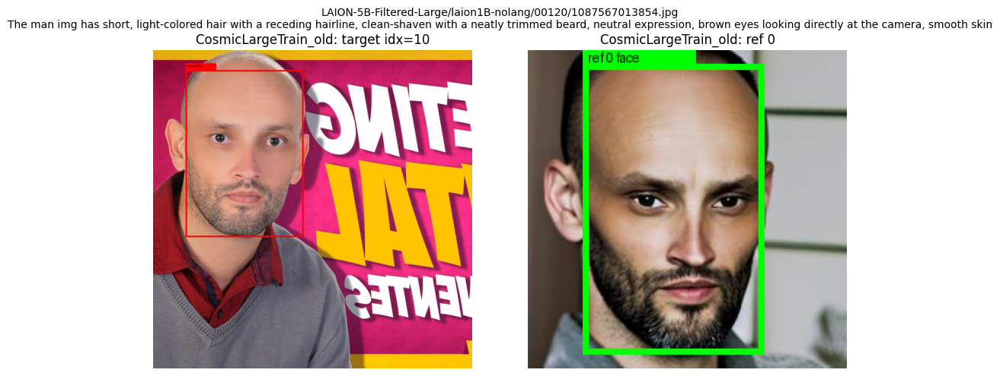

In [6]:
RANDOM_SAMPLE_COUNT = 8
rng = random.Random(BASE_SEED)
random_new_indices = rng.sample(shared_new_indices, k=min(RANDOM_SAMPLE_COUNT, len(shared_new_indices)))
print('random new indices:', random_new_indices)

for idx in random_new_indices:
    print('=' * 120)
    compare_same_path(new_idx=idx, seed=BASE_SEED)

## Manual Single-Sample Inspection

Use this for focused inspection after the random overview. Change `new_idx` to inspect a specific sample.

[CosmicLargeTrain] idx=12
target path: LAION-5B-Filtered-Large/laion1B-nolang/00120/1061231002161.jpg
prompt: The girl img has long brown hair in a braid, youthful face, cheerful smile showing teeth, light skin, expressive dark eyes, happy and engaged appearance, sits at a table, wears a light blue cardigan over a purple shirt, arms rest on the table, hands near a toy castle, body slightly left, facing the camera, relaxed and attentive posture, white couch with sparkling pillows, miniature ice castle toy set on the table, string lights behind, cozy and playful festive atmosphere
pixel_values: (3, 1024, 1024)
face_bbox: [632, 335, 802, 551]
num ref images: 1
ref image sizes: [(256, 256)]
face_bbox_ref: [28.0, 34.0, 199.0, 240.0]
face_bboxes_ref: [[28.0, 34.0, 199.0, 240.0]]
keys: ['background_caption', 'bbox', 'crop_top_lefts', 'face_bbox', 'face_bbox_ref', 'face_bboxes_ref', 'face_mask', 'facial_caption', 'original_sizes', 'pixel_values', 'pose_caption', 'prompt', 'prompts', 'ref_image

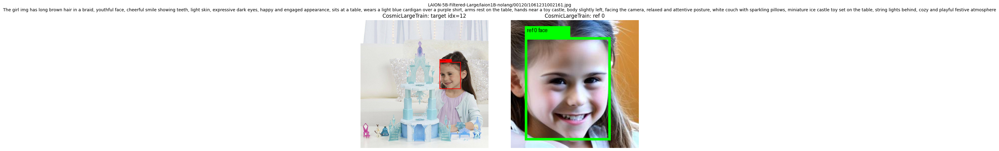

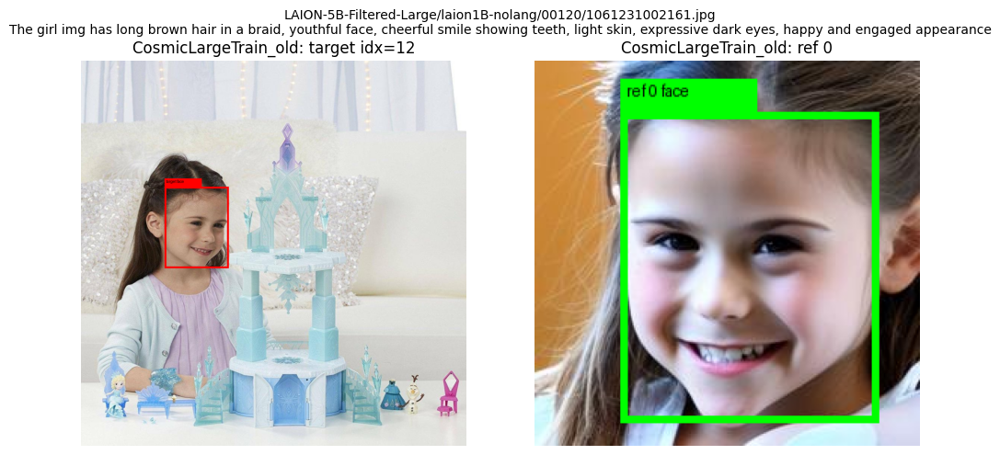

In [7]:
new_item, old_item = compare_same_path(new_idx=random_new_indices[0], seed=BASE_SEED)

## Collated Batch Fields

Training uses `collate_fn` after dataset `__getitem__`. With `dataloaders.train.batch_size=1`, this is the structure passed to `model.forward` before the model converts references into ID tensors/reference latents.

In [8]:
def show_collated_batch(ds, name, idx=0, seed=BASE_SEED):
    item = get_item(ds, idx, seed=seed)
    batch = collate_fn([item])
    print(f'[{name}] collated batch idx={idx}')
    for key, value in batch.items():
        if torch.is_tensor(value):
            print(f'{key}: tensor shape={tuple(value.shape)} dtype={value.dtype}')
        elif isinstance(value, list):
            print(f'{key}: list len={len(value)} type0={type(value[0]).__name__ if value else None}')
            if key == 'ref_images' and value:
                refs0 = value[0] if isinstance(value[0], (list, tuple)) else [value[0]]
                print('  ref_images[0] count:', len(refs0))
                print('  ref_images[0] sizes:', [r.size if isinstance(r, Image.Image) else tuple(r.shape) for r in refs0])
        else:
            print(f'{key}: {type(value).__name__} {value}')
    return batch


new_batch = show_collated_batch(new_ds, 'CosmicLargeTrain', idx=0)
print()
old_batch = show_collated_batch(old_ds, 'CosmicLargeTrain_old', idx=old_idx_by_path[target_path_for_dataset_item(new_ds, 0)])

[CosmicLargeTrain] collated batch idx=0
pixel_values: tensor shape=(1, 3, 1024, 1024) dtype=torch.float32
facial_caption: list len=1 type0=str
pose_caption: list len=1 type0=str
background_caption: list len=1 type0=str
prompts: list len=1 type0=str
prompt: list len=1 type0=str
bbox: list len=1 type0=list
face_bbox: list len=1 type0=list
ref_images: list len=1 type0=list
  ref_images[0] count: 1
  ref_images[0] sizes: [(256, 249)]
face_bboxes_ref: list len=1 type0=list
face_bbox_ref: list len=1 type0=list
original_sizes: list len=1 type0=tuple
crop_top_lefts: list len=1 type0=tuple
face_mask: list len=1 type0=Tensor
target_sizes: list len=1 type0=tuple

[CosmicLargeTrain_old] collated batch idx=0
pixel_values: tensor shape=(1, 3, 1024, 1024) dtype=torch.float32
face_bbox: list len=1 type0=list
face_bbox_ref: list len=1 type0=list
ref_images: list len=1 type0=list
  ref_images[0] count: 1
  ref_images[0] sizes: [(256, 249)]
prompts: list len=1 type0=str
prompt: list len=1 type0=str
origi

## Notes

- `pixel_values` is transformed exactly as in the training config: resized to 1024 and normalized to `[-1, 1]`.
- `ref_images` remain PIL images at dataset/collate time. They are processed later in `PhotomakerBranchedLora.forward` by `id_image_processor` and `_encode_reference_latent`.
- For `CosmicLargeTrain`, `face_bboxes_ref` is the multi-reference field used by the current branched-attention path. With `NUM_REFS=1`, it should contain a one-element list. `face_bbox_ref` is still present for compatibility.
- For `CosmicLargeTrain_old`, only `face_bbox_ref` is expected. The notebook normalizes both formats for visualization.